In [1]:
# Main
import os
from drillsim.driver import main_driver as main_driver

# enter output folder path
# outputFolderPath = r"D:\Project\output"

THIS_FOLDER = os.path.dirname(os.path.abspath("__file__"))
outputFolderPath = os.path.join(THIS_FOLDER, 'Output')

# enter input excel sheet location
# input_excel_path = r"D:/Project/Input/EM_drill_sim_input_sheet.xlsx"
input_excel_path = os.path.join(THIS_FOLDER, 'Input/EM_drill_sim_input_sheet.xlsx')

main_driver(input_excel_path, outputFolderPath, fric_mod="coulomb", save_pickle=True)

In [2]:
# Load Output
import pickle
import os

output_excel_path = os.path.join(outputFolderPath, 'Output.pickle')
with open(output_excel_path, 'rb') as fp:
  p = pickle.load(fp)

CSV EXPORT

In [3]:
import numpy as np

data={
    "Fric_Force_C" : np.array(p["new_force"]) / 4.45,        # Lbf-ft
    "Time_C" : np.array(p["solution_time"]),
    "Time_bit_C" : np.array(p['time_array']),
    "Bit_RPM_C": np.array(p['solution_numpy_array'][-1]) * (30 / np.pi)
}

In [6]:
data["Fric_Force_S"] = np.array(p["new_force"]) / 4.45        # Lbf-ft
data["Time_S"] = np.array(p["solution_time"])
data["Time_bit_S"] = np.array(p['time_array'])
data["Bit_RPM_S"] = np.array(p['solution_numpy_array'][-1]) * (30 / np.pi)

In [1]:
import os
from drillsim.driver import main_driver as main_driver


THIS_FOLDER = os.path.dirname(os.path.abspath("__file__"))
outputFolderPath = os.path.join(THIS_FOLDER, 'Output')

input_excel_path = os.path.join(THIS_FOLDER, 'Input/EM_drill_sim_input_sheet.xlsx')
main_driver(input_excel_path, outputFolderPath, fric_mod="stribeck", save_pickle=True)

In [2]:
# Load Output
import pickle
import os

output_excel_path = os.path.join(outputFolderPath, 'Output.pickle')
with open(output_excel_path, 'rb') as fp:
  p = pickle.load(fp)

In [3]:
import pandas as pd
import numpy as np

data1=pd.DataFrame(
    {
    "Source Term" : np.array(p["new_force"]) / 4.45,        # Lbf-ft
    "Time" : np.array(p["solution_time"])
    }
)
data2 = pd.DataFrame(
    {
    "Time" : np.array(p['time_array']),
    "w_bit": np.array(p['solution_numpy_array'][-1]) * (30 / np.pi)
    }
)

In [5]:
merged_df = pd.merge(data1, data2, on='Time')
merged_df.to_csv("testcase_2b_coulomb_10RPM.csv", index=False)

*************************** Testing AREA ********************

Making PLOTS !

In [6]:
stribeck_dixit = pd.read_csv('testcase_2b_stribeck_4RPM.csv')
coulomb_dixit = pd.read_csv('testcase_2b_coulomb_10RPM.csv')

In [7]:
stribeck_as = pd.read_csv('data_mu_0.50_mu_d_0.25_v_cs_0.42_stribeck1.csv')
coulomb_as = pd.read_csv('data_mu_0.50_mu_d_0.25_v_cs_1.05_coulomb1.csv')

In [66]:
coulomb_df_4 = pd.read_csv('testcase_2b_coulomb_4RPM.csv')

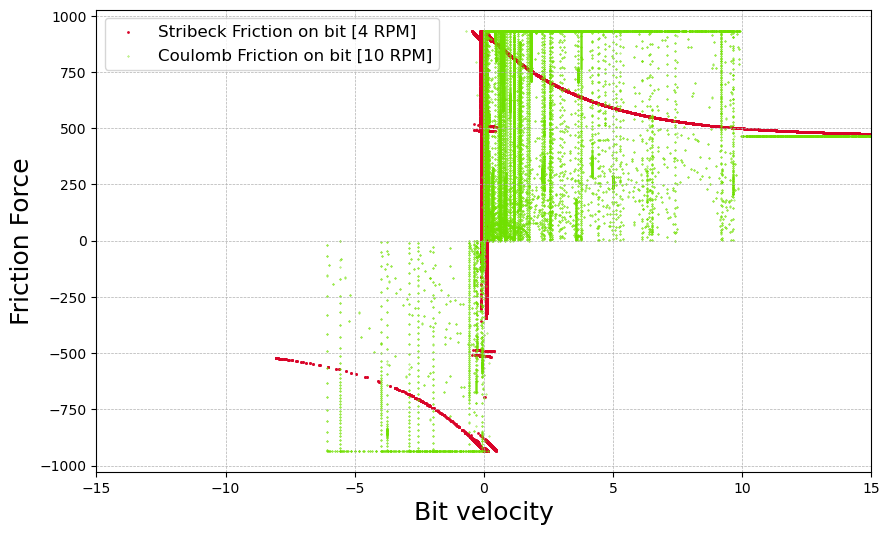

In [8]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 6))
ax.scatter(
    x=stribeck_dixit['w_bit'],
    y=stribeck_dixit['Source Term'],
    s=1,
    c='#d90429',
    alpha=1,
    label='Stribeck Friction on bit [4 RPM]'
)
ax.scatter(
    x=coulomb_dixit['w_bit'],
    y=coulomb_dixit['Source Term'],
    s=0.1,
    c='#70e000',
    alpha=1,
    label='Coulomb Friction on bit [10 RPM]'
)
# ax.scatter(
#     x=stribeck_as['V_bit'],
#     y=stribeck_as['Source Term'],
#     s=1,
#     c='blue',
#     alpha=1,
#     label='Stribeck Friction on bit (A-S) [4 RPM]'
# )
# ax.scatter(
#     x=coulomb_as['V_bit'],
#     y=coulomb_as['Source Term'],
#     s=1,
#     c='red',
#     alpha=1,
#     label='Coulomb Friction on bit (A-S) [10 RPM]'
# )
# ax.scatter(
#     x=coulomb_df_4['w_bit'],
#     y=coulomb_df_4['Source Term'],
#     s=0.1,
#     c='#4cc9f0',
#     alpha=1,
#     label='Coulomb Friction on bit [4 RPM]'
# )
ax.set_xlabel("Bit velocity", fontsize=18)
ax.set_xlim(-15,15),
ax.set_ylabel("Friction Force", fontsize=18)
# ax.set_title("Friction Force vs. bit velocity", fontsize=20)
ax.grid(True, which='both', linestyle='--', linewidth=0.5)
ax.legend(fontsize=12)
plt.show()

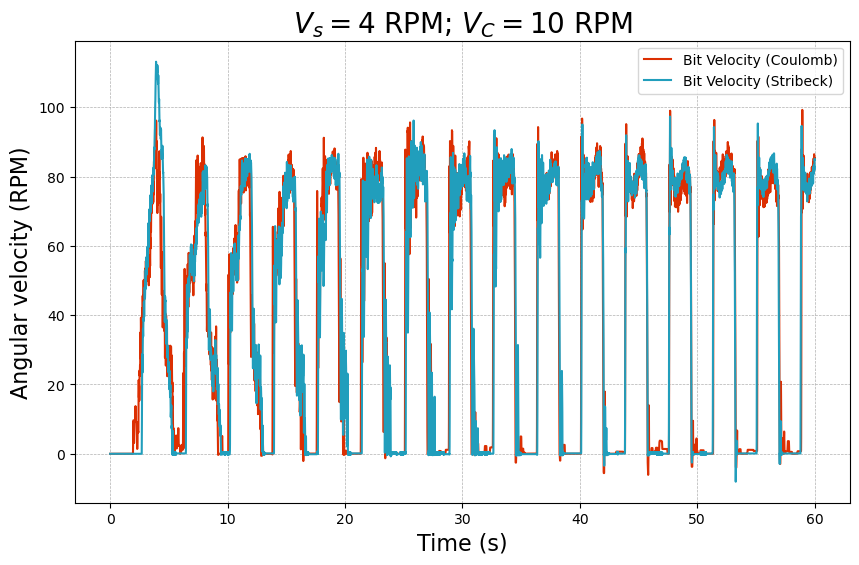

In [10]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(
    coulomb_dixit['Time'],
    coulomb_dixit['w_bit'],
    # s=1,
    c='#dc2f02',
    # alpha=0.8,
    label='Bit Velocity (Coulomb)'
)
ax.plot(
    stribeck_dixit['Time'],
    stribeck_dixit['w_bit'],
    # s=1,
    c='#219ebc',
    alpha=1,
    label='Bit Velocity (Stribeck)'
)
ax.set_xlabel("Time (s)", fontsize=16)
ax.set_ylabel("Angular velocity (RPM)", fontsize=16)
ax.set_title("$V_s = 4$ RPM; $V_C = 10$ RPM", fontsize=20)
ax.grid(True, which='both', linestyle='--', linewidth=0.5)
ax.legend()
plt.show()

NameError: name 'coulomb_df_4' is not defined

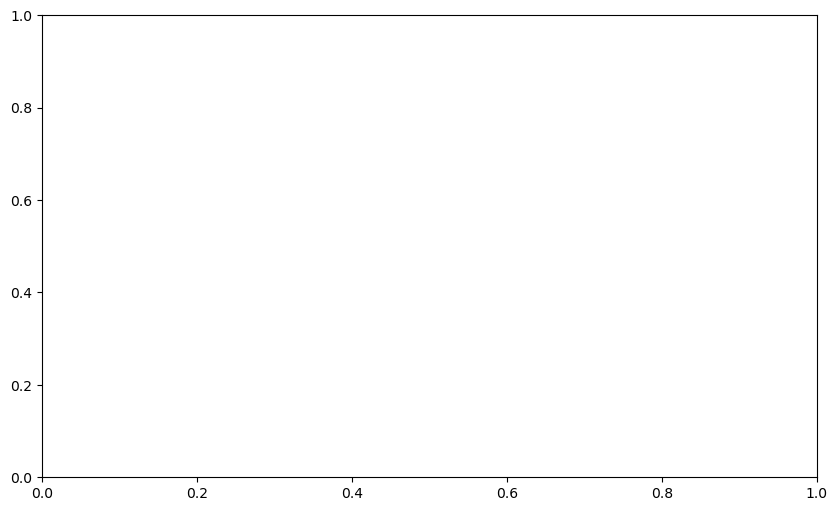

In [11]:
fig1, ax1 = plt.subplots(figsize=(10, 6))
ax1.plot(
    coulomb_df_4['Time'],
    coulomb_df_4['w_bit'],
    # s=1,
    c='#dc2f02',
    # alpha=0.8,
    label='Bit Velocity (Coulomb)'
)
ax1.plot(
    stribeck_dixit['Time'],
    stribeck_dixit['w_bit'],
    # s=1,
    c='#219ebc',
    alpha=1,
    label='Bit Velocity (Stribeck)'
)
ax1.set_xlabel("Time (s)", fontsize=16)
ax1.set_ylabel("Angular velocity (RPM)", fontsize=16)
ax1.set_title("$V_s = V_C = 4$ RPM", fontsize=20)
ax1.grid(True, which='both', linestyle='--', linewidth=0.5)
ax1.legend()
plt.show()

c:\Users\elmir.hamidov\AppData\Local\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



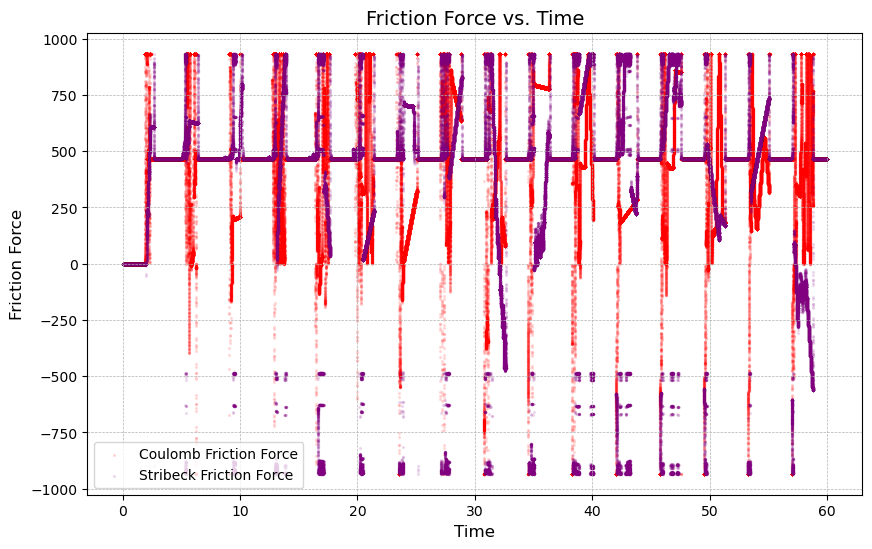

In [7]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 6))
ax.scatter(
    x=data["Time_C"], 
    y=data["Fric_Force_C"],
    s=2, 
    c="red", 
    alpha=0.1, 
    label="Coulomb Friction Force"
)
ax.scatter(
    x=data["Time_S"], 
    y=data["Fric_Force_S"], 
    s=2,
    c="purple", 
    alpha=0.1, 
    label="Stribeck Friction Force"
)

ax.set_xlabel("Time", fontsize=12)
ax.set_ylabel("Friction Force", fontsize=12)
ax.set_title("Friction Force vs. Time", fontsize=14)
ax.grid(True, which='both', linestyle='--', linewidth=0.5)
ax.legend()
plt.show()

In [12]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Scatter(
    x=stribeck_dixit['Time'],
    y=stribeck_dixit['w_bit'],
    mode='lines',
    name='Dixit - bit   ',
    marker=dict(color='#00FF00')
))

fig.add_trace(go.Scatter(
    x=stribeck_as['Time'],
    y=stribeck_as['V_bit'],
    mode='lines',
    name='A-S - bit',
    marker=dict(color='#FF0000')
))

# Add the layout configurations
fig.update_layout(
    title={
        'text': 'Stribeck Friction Model Comparison',
        'y':0.9, 
        'x':0.5, 
        'xanchor': 'center',
        'font': dict(
            size=26 
        )
    },
    xaxis=dict(
        title='Time (s)',
        title_font=dict(size=26),
        tickfont=dict(size=18),
        range=[-2,62],
        showgrid=True,
        gridwidth=0.5,
        gridcolor='#58C4DD',
        tickcolor='white',
        zeroline=False
    ),
    yaxis=dict(
        title='Angular Velocity (RPM)',
        title_font=dict(size=26),
        tickfont=dict(size=18),
        showgrid=True,
        gridwidth=0.5,
        gridcolor='#58C4DD',
        tickcolor='white',
        zeroline=False
    ),
    legend=dict(
        # title='Type of Friction',
        font=dict(size=18),
        orientation='h',
        x=0.5,
        xanchor='center',
        y=-0.18,
        yanchor='top'
    ),
    template='plotly_dark',
    width=1000,
    height=600
)

fig.show()


In [13]:
fig1 = go.Figure()

fig1.add_trace(go.Scatter(
    x=coulomb_dixit['Time'],
    y=coulomb_dixit['w_bit'],
    mode='lines',
    name='Dixit - bit   ',
    marker=dict(color='#00FF00')
))

fig1.add_trace(go.Scatter(
    x=coulomb_as['Time'],
    y=coulomb_as['V_bit'],
    mode='lines',
    name='A-S - bit',
    marker=dict(color='#FF0000')
))

# Add the layout configurations
fig1.update_layout(
    title={
        'text': 'Coulomb Friction Model Comparison',
        'y':0.9, 
        'x':0.5, 
        'xanchor': 'center',
        'font': dict(
            size=26 
        )
    },
    xaxis=dict(
        title='Time (s)',
        title_font=dict(size=26),
        tickfont=dict(size=18),
        range=[-2,62],
        showgrid=True,
        gridwidth=0.5,
        gridcolor='#58C4DD',
        tickcolor='white',
        zeroline=False
    ),
    yaxis=dict(
        title='Angular Velocity (RPM)',
        title_font=dict(size=26),
        tickfont=dict(size=18),
        showgrid=True,
        gridwidth=0.5,
        gridcolor='#58C4DD',
        tickcolor='white',
        zeroline=False
    ),
    legend=dict(
        # title='Type of Friction',
        font=dict(size=18),
        orientation='h',
        x=0.5,
        xanchor='center',
        y=-0.18,
        yanchor='top'
    ),
    template='plotly_dark',
    width=1000,
    height=600
)

fig1.show()


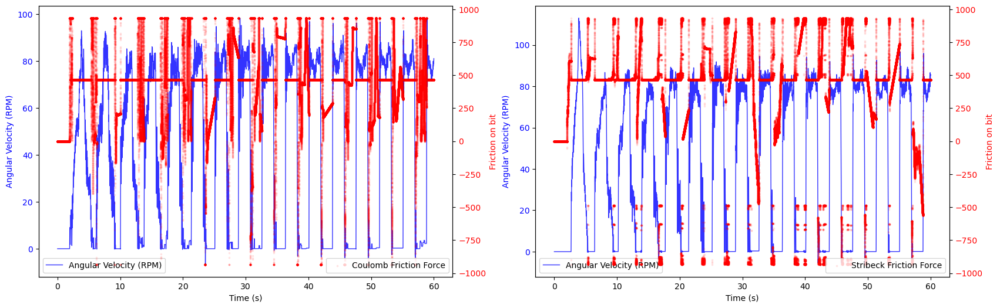

In [13]:
fig, ax = plt.subplots(1, 2, sharex=True, sharey=False, figsize=(20, 6))
ax[0].plot(
    data["Time_bit_C"], 
    data["Bit_RPM_C"], 
    color="blue",
    linewidth=1, 
    alpha=0.8, 
    label="Angular Velocity (RPM)"
)
ax[0].set_ylabel('Angular Velocity (RPM)', color='blue')
ax[0].set_xlabel('Time (s)')
ax[0].tick_params(axis='y', labelcolor='blue')

ax2 = ax[0].twinx()
ax2.scatter(
    data["Time_C"], 
    data["Fric_Force_C"],
    s=3, 
    color="red", 
    alpha=0.075, 
    label="Coulomb Friction Force"
)
ax2.set_ylabel('Friction on bit', color='red')
ax2.tick_params(axis='y', labelcolor='red')

ax[0].legend(loc='lower left')
ax2.legend(loc='lower right')

ax[1].plot(
    data["Time_bit_S"], 
    data["Bit_RPM_S"], 
    color="blue",
    linewidth=1, 
    alpha=0.8, 
    label="Angular Velocity (RPM)"
)
ax[1].set_ylabel('Angular Velocity (RPM)', color='blue')
ax[1].set_xlabel('Time (s)')
ax[1].tick_params(axis='y', labelcolor='blue')

ax3 = ax[1].twinx()
ax3.scatter(
    data["Time_S"], 
    data["Fric_Force_S"],
    s=3, 
    color="red", 
    alpha=0.075, 
    label="Stribeck Friction Force"
)
ax3.set_ylabel('Friction on bit', color='red')
ax3.tick_params(axis='y', labelcolor='red')

ax[1].legend(loc='lower left')
ax3.legend(loc='lower right')